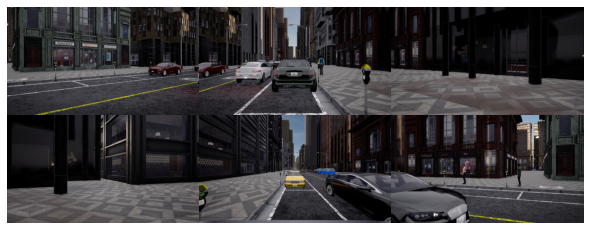

In [2]:
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import gzip
import json

ITEM = "0010"
SET = "routes_training_new_mini"
ROUTE = "route_single_routes_training_single_date_07_07_10_17_56"

CALIB = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/calib/{ITEM}.txt"
LABEL_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/labels/{ITEM}.txt"
PCD_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/points/{ITEM}.bin" 
CAM_FRONT_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/CAM_FRONT/{ITEM}.jpg" 
CAM_FRONT_LEFT_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/CAM_FRONT_LEFT/{ITEM}.jpg"
CAM_FRONT_RIGHT_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/CAM_FRONT_RIGHT/{ITEM}.jpg"
CAM_BACK_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/CAM_BACK/{ITEM}.jpg"
CAM_BACK_LEFT_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/CAM_BACK_LEFT/{ITEM}.jpg"
CAM_BACK_RIGHT_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/CAM_BACK_RIGHT/{ITEM}.jpg"
SEMANTIC_LIDAR_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/lidar_semantic/{ITEM}.laz"
MEASUREMENTS_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/measurements/{ITEM}.json.gz"
RADAR_PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/radar_points/{ITEM}.bin"

# loas measurements
with gzip.open(MEASUREMENTS_PATH, 'rt') as f:
    measurements = json.load(f)

# load calib
calib = {}
with open(CALIB, 'r') as f:
    for line in f.readlines():
        key, value = line.strip().split(':', 1)
        calib[key] = np.array(value.split(), dtype=np.float32).reshape(4, 4)

# load labels
labels = []
with open(LABEL_PATH, 'r') as f:
    for line in f.readlines():
        labels.append(line.strip().split())

# do a 2x3 mosaic with the 6 cameras, in the order: CAM_FRONT_LEFT, CAM_FRONT, CAM_FRONT_RIGHT, CAM_BACK_LEFT, CAM_BACK, CAM_BACK_RIGHT
fig = plt.figure(figsize=(8, 3))
cam_front_left = plt.imread(CAM_FRONT_LEFT_PATH)
cam_front = plt.imread(CAM_FRONT_PATH)
cam_front_right = plt.imread(CAM_FRONT_RIGHT_PATH)
cam_back_left = plt.imread(CAM_BACK_LEFT_PATH)
cam_back = plt.imread(CAM_BACK_PATH)
cam_back_right = plt.imread(CAM_BACK_RIGHT_PATH)
plt.subplot(2, 3, 1)
plt.imshow(cam_front_left)
plt.axis('off')
plt.subplot(2, 3, 2)
plt.imshow(cam_front)
plt.axis('off')
plt.subplot(2, 3, 3)
plt.imshow(cam_front_right)
plt.axis('off')
plt.subplot(2, 3, 6)    
plt.imshow(cam_back_left)
plt.axis('off')
plt.subplot(2, 3, 5)
plt.imshow(cam_back)
plt.axis('off')
plt.subplot(2, 3, 4)
plt.imshow(cam_back_right)
plt.axis('off')
# Eliminar espacios entre subplots
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
plt.savefig(f"{ITEM}_cameras_mosaic.png", bbox_inches='tight', dpi=300)
plt.show()

In [3]:
def draw_labels_ego_bev(labels):
    for label in labels:
        if label[0] == 'car':
            color = 'red'
        elif label[0] == 'walker':
            color = 'blue'
        elif label[0] == 'cyclist':
            color = 'green'
        else:
            continue  # Skip unknown classes

        x = float(label[4])
        y = float(label[5])
        z = float(label[6])  # z is not used in BEV
        w = float(label[1])
        h = float(label[2]) # h is not used in BEV
        l = float(label[3])
        rot = float(label[7])  # rotation around the z-axis
        # Calculate the corners of the bounding box
        corners = np.array([
            [-l/2, -w/2, 0],
            [l/2, -w/2, 0],
            [l/2, w/2, 0],
            [-l/2, w/2, 0]
        ])
        # Rotate the corners
        rotation_matrix = np.array([
            [np.cos(rot), -np.sin(rot), 0],
            [np.sin(rot), np.cos(rot), 0],
            [0, 0, 1]
        ])
        corners = np.dot(corners, rotation_matrix.T)
        # Translate the corners to the object's position
        corners += np.array([x, y, z])
        # Plot the bounding box

        # draw a line for the orientation of each label
        plt.plot([x, x + np.cos(rot) * l / 2], [y, y + np.sin(rot) * l / 2], color=color, linewidth=1, alpha=0.5)

        plt.fill(corners[:, 0], corners[:, 1], color=color, alpha=0.2, edgecolor='black')
        # plt.text(x, y, label[0], color='black', fontsize=8, ha='center', va='center')
    

## LiDAR PCD IN LiDAR FRAME

Point cloud shape: (31463, 4)


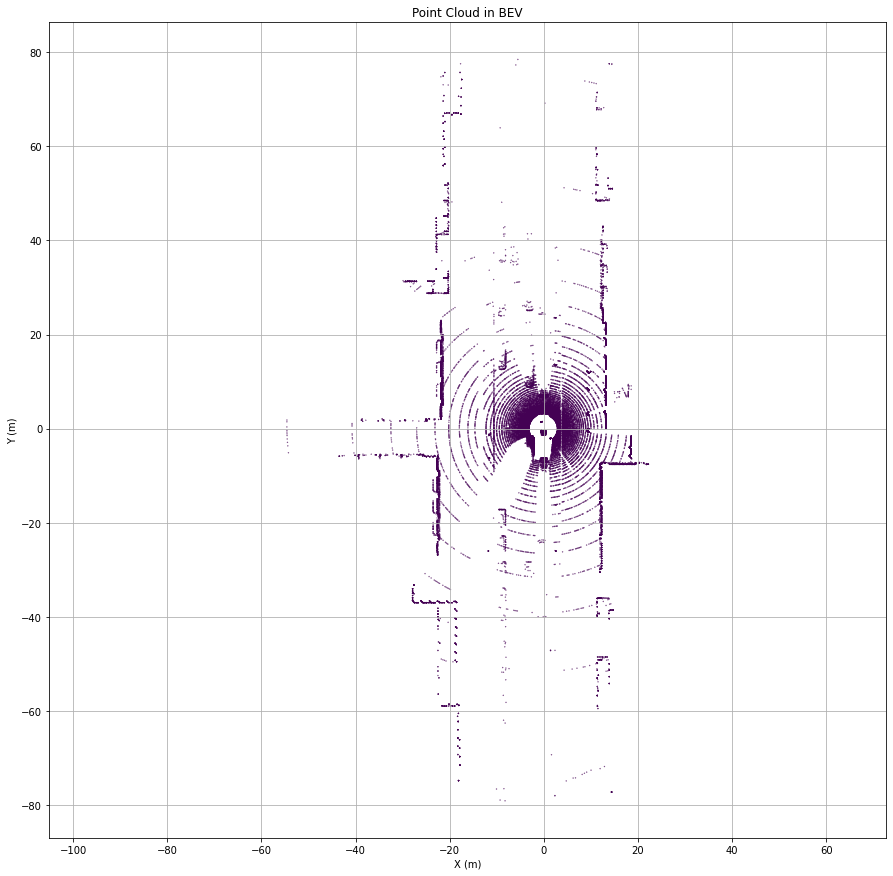

In [4]:
# plot the pcd in bev
pcd = np.fromfile(PCD_PATH, dtype=np.float32).reshape(-1, 4)

print(f"Point cloud shape: {pcd.shape}")

plt.figure(figsize=(15, 15))
plt.scatter(pcd[:, 0], pcd[:, 1], c=pcd[:, 3], s=0.1, cmap='viridis')
plt.axis('equal')
plt.title('Point Cloud in BEV')
plt.xlabel('X (m)')
plt.ylabel('Y (m)')
plt.grid(True)
# plt.savefig(f"{ITEM}_pcd_bev.png", bbox_inches='tight', dpi=300)
plt.show()

# LIDAR PCD AND INSTANCES IN EGO FRAME

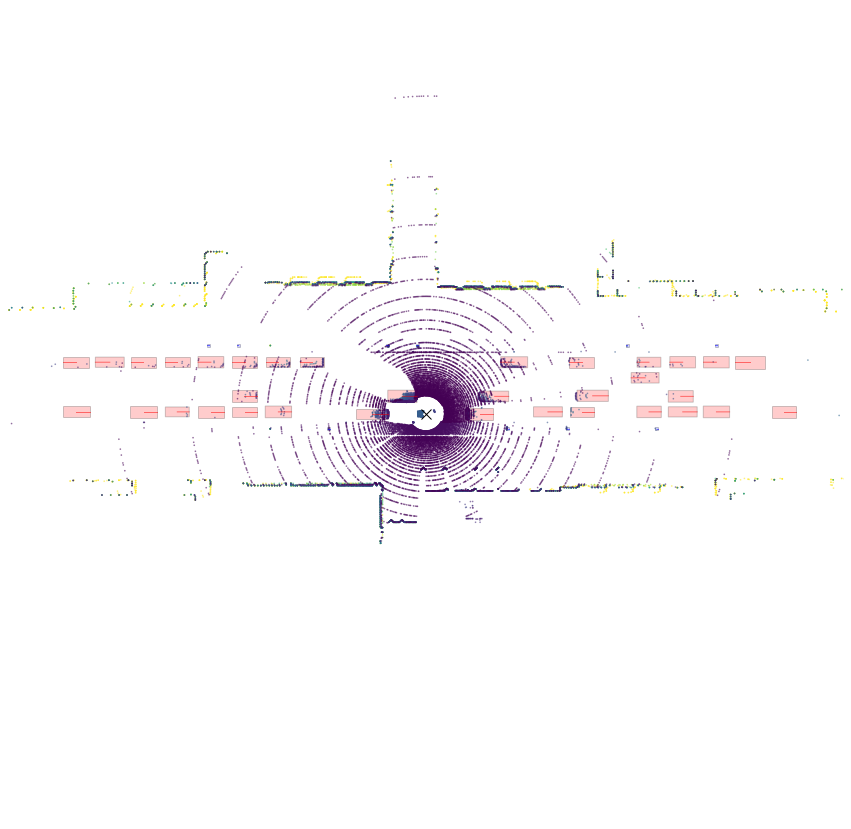

In [5]:
# plot labels in bev
plt.figure(figsize=(15, 15))

# draw an X in the center (ego vehicle)
plt.plot(0, 0, 'kx', markersize=10, label='Ego Vehicle')

draw_labels_ego_bev(labels)

# convert pcd to egoframe using calib['LIDAR2EGO']
pcd_ego = np.dot(calib['LIDAR2EGO'][:3, :3], pcd[:, :3].T).T + calib['LIDAR2EGO'][:3, 3]
plt.scatter(pcd_ego[:, 0], pcd_ego[:, 1], c=pcd_ego[:, 2], s=0.5, cmap='viridis', alpha=0.5, vmin=0, vmax=5)
plt.axis('off')
# plt.title('Labels in BEV')
# plt.xlabel('X (m)')
# plt.ylabel('Y (m)')
plt.xlim(-70, 70)
plt.ylim(-70, 70)
plt.grid(True)
plt.savefig(f"{ITEM}_labels_bev.png", bbox_inches='tight', dpi=300)
plt.show()

# RADAR PCD IN EGO FRAME

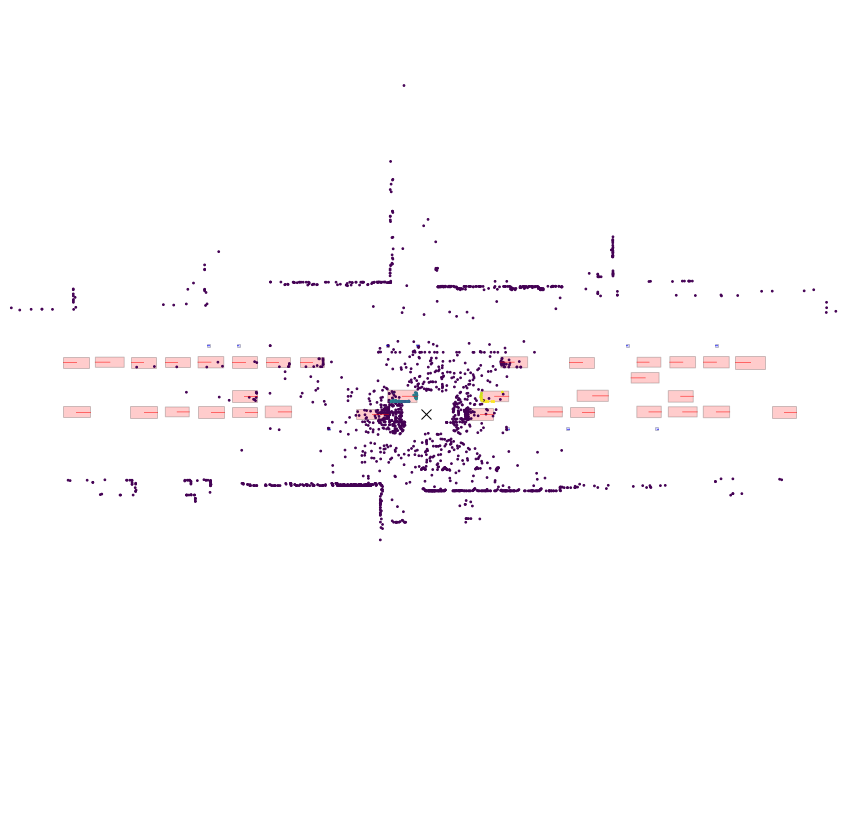

In [6]:
plt.figure(figsize=(15, 15))

radar_pcd = np.fromfile(RADAR_PATH, dtype=np.float32).reshape(-1, 9) # it comes in lidar frame

x = radar_pcd[:, 0]
y = radar_pcd[:, 1]
z = radar_pcd[:, 2]
vx = radar_pcd[:, 3]
vy = radar_pcd[:, 4]

radar_pcd_hom = np.hstack((radar_pcd[:, :3], np.ones((radar_pcd.shape[0], 1))))  # Add a column of ones for homogeneous coordinates
radar_pcd_ego = np.dot(calib['LIDAR2EGO'], radar_pcd_hom.T).T[:, :3]  # Convert to ego frame

x = radar_pcd_ego[:, 0]
y = radar_pcd_ego[:, 1]

# draw X in 0 0
plt.plot(0, 0, 'kx', markersize=10, label='Ego Vehicle')

draw_labels_ego_bev(labels)

plt.scatter(x, y, c=np.sqrt(vx**2 + vy**2), s=3, cmap='viridis', alpha=1)
plt.axis('off')
plt.xlabel('X (m)')
plt.ylabel('Y (m)') 
plt.xlim(-70, 70)
plt.ylim(-70, 70)
plt.savefig(f"{ITEM}_radar_bev.png", bbox_inches='tight', dpi=300)
plt.show()


Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_FRONT/0010.bin
length of radar points: 496
Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_FRONT_LEFT/0010.bin
length of radar points: 466
Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_FRONT_RIGHT/0010.bin
length of radar points: 500
Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_BACK_LEFT/0010.bin
length of radar points: 471
Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_BACK_RIGHT/0010.bin
length of radar points: 473


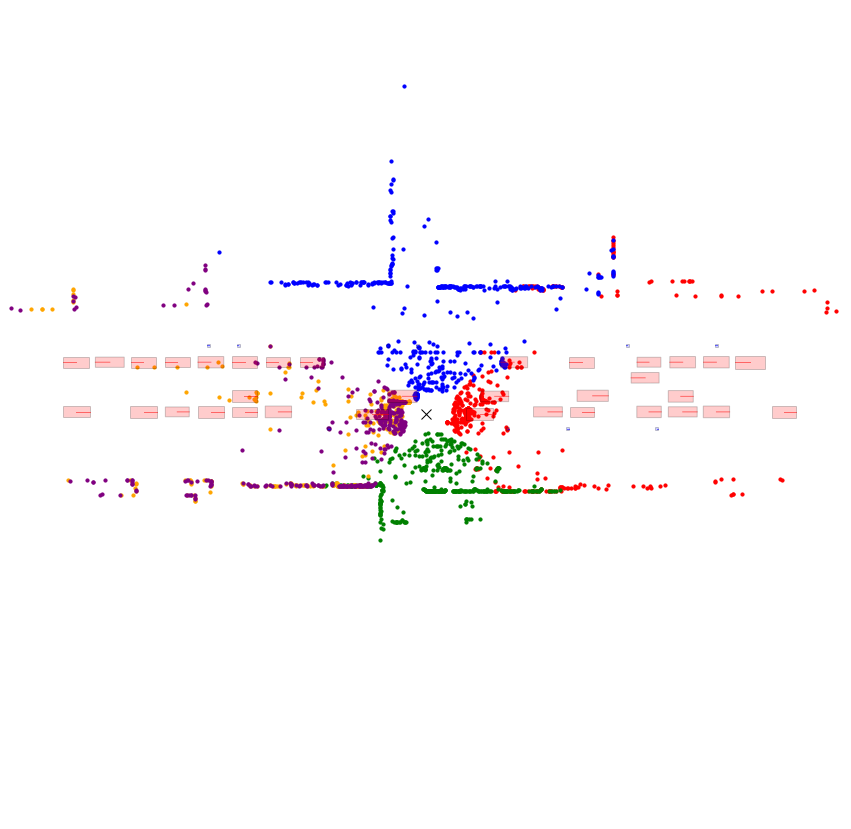

In [7]:
# RADAR PCDS
radar_matrices = [
    calib['LIDAR2RADAR_FRONT'],
    calib['LIDAR2RADAR_FRONT_LEFT'],
    calib['LIDAR2RADAR_FRONT_RIGHT'],
    calib['LIDAR2RADAR_BACK_LEFT'],
    calib['LIDAR2RADAR_BACK_RIGHT']
]

plt.figure(figsize=(15, 15))

RADAR_FILES = [
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_FRONT/{ITEM}.bin",
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_FRONT_LEFT/{ITEM}.bin",
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_FRONT_RIGHT/{ITEM}.bin",
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_BACK_LEFT/{ITEM}.bin",
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_BACK_RIGHT/{ITEM}.bin",
]

for i, radar_file in enumerate(RADAR_FILES):
    print(f"Processing radar file: {radar_file}")
    # open bin file
    pcd = np.fromfile(radar_file, dtype=np.float32)
    pcd = pcd.reshape(-1, 4)

    # following data are given in radians
    ranges = pcd[:, 0]
    altitude = pcd[:, 1]
    azimuth = pcd[:, 2]  # this is in meters
    velocity = pcd[:, 3]  # this is in m/s

    # convert to x, y, z
    x = ranges * np.cos(azimuth) * np.cos(altitude)  # altitude is in radians, convert to meters
    y = -ranges * np.sin(azimuth) * np.cos(altitude)  # Y comes inverted
    z = ranges * np.sin(altitude)  # altitude is already in meters

    # add a point to 0, 0 to know radar center
    # x = np.append(x, 0)
    # y = np.append(y, 0)
    # z = np.append(z, 0)
    # velocity = np.append(velocity, 0)  # add a velocity of 0 for the center point
    # range = np.append(range, 0)  # add a range of 0 for the center point

    # points are in radar frame, move them to ego frame using LIDAR2RADAR_FRONT and LIDAR2EGO
    pcd_homogeneous = np.hstack((x[:, np.newaxis], y[:, np.newaxis], z[:, np.newaxis], np.ones((x.shape[0], 1))))
    # pcd_ego = pcd_homogeneous @ radar_matrices[i].T @ LIDAR2EGO.T

    RADAR2EGO = calib['LIDAR2EGO'] @ np.linalg.inv(radar_matrices[i])
    pcd_radar_ego = pcd_homogeneous @ RADAR2EGO.T

    print(f"length of radar points: {len(pcd_radar_ego)}")

    x = pcd_radar_ego[:, 0]
    y = pcd_radar_ego[:, 1]  # Y COMES INVERTED

    # put one color for each of the 5 radars
    color = ['red', 'blue', 'green', 'orange', 'purple'][i]

    plt.scatter(x, y, c=color, s=10, label=os.path.basename(radar_file), vmax=40, vmin=0)  # Coloreado por velocidad

    # sc = plt.scatter(x, y, c=velocity, cmap='coolwarm', s=10, label=os.path.basename(radar_file))  # Coloreado por velocidad
    
# draw an X in the center (ego vehicle)
plt.plot(0, 0, 'kx', markersize=10, label='Ego Vehicle')

for label in labels:
    if label[0] == 'car':
        color = 'red'
    elif label[0] == 'walker':
        color = 'blue'
    elif label[0] == 'cyclist':
        color = 'green'
    else:
        continue  # Skip unknown classes

    x = float(label[4])
    y = float(label[5])
    z = float(label[6])  # z is not used in BEV
    w = float(label[1])
    h = float(label[2]) # h is not used in BEV
    l = float(label[3])
    rot = float(label[7])  # rotation around the z-axis
    # Calculate the corners of the bounding box
    corners = np.array([
        [-l/2, -w/2, 0],
        [l/2, -w/2, 0],
        [l/2, w/2, 0],
        [-l/2, w/2, 0]
    ])
    # Rotate the corners
    rotation_matrix = np.array([
        [np.cos(rot), -np.sin(rot), 0],
        [np.sin(rot), np.cos(rot), 0],
        [0, 0, 1]
    ])
    corners = np.dot(corners, rotation_matrix.T)
    # Translate the corners to the object's position
    corners += np.array([x, y, z])
    # Plot the bounding box

    # draw a line for the orientation of each label
    plt.plot([x, x + np.cos(rot) * l / 2], [y, y + np.sin(rot) * l / 2], color=color, linewidth=1, alpha=0.5)

    plt.fill(corners[:, 0], corners[:, 1], color=color, alpha=0.2, edgecolor='black')
    # plt.text(x, y, label[0], color='black', fontsize=8, ha='center', va='center')

# plt.colorbar(sc, label='Velocity (m/s)')

# i want to add lines that mark the hfov of each radar. This is 15º to each side of the center of the bev, also up and down
# hfov = 40  # degrees
# angles = np.radians(np.array([-hfov, hfov]))
# for angle in angles:
#     # Calculate the end points of the lines
#     x_line = np.array([-20, 20]) * np.cos(angle)
#     y_line = np.array([-20, 20]) * np.sin(angle)
#     plt.plot(x_line, y_line, 'r--', linewidth=3)  # dashed line for hfov
#     plt.text(x_line[1], y_line[1], f'{np.degrees(angle):.0f}°', fontsize=10, ha='right')

# # also vertical 15º lines
# for angle in angles:
#     # Calculate the end points of the lines
#     x_line = np.array([-20, 20]) * np.cos(angle + np.pi / 2)
#     y_line = np.array([-20, 20]) * np.sin(angle + np.pi / 2)
#     plt.plot(x_line, y_line, 'r--', linewidth=3)  # dashed line for hfov
#     plt.text(x_line[1], y_line[1], f'{np.degrees(angle + np.pi / 2):.0f}°', fontsize=10, ha='right')

# show only frontal points
# frontal_points = lidar_pcd[lidar_pcd[:, 0] > 0]
# plt.xlabel('X (m)')
# plt.ylabel('Y (m)')
# plt.title('Radar and Lidar Bird’s Eye View')
plt.axis('off')
# plt.grid(False)
plt.xlim(-70, 70)
plt.ylim(-70, 70)
plt.savefig(f"{ITEM}_radar_lidar_bev.png", bbox_inches='tight', dpi=300)
plt.show()
# save


In [8]:
# 'do nothing' if 'np' not in globals() else np.set_printoptions(3, suppress=True);

# plt.figure(figsize=(20, 20))

# # plt.subplots(1, 5, figsize=(20, 4))
# # plt.suptitle('Radar Velocity Histograms', fontsize=16)
# ego_speed = measurements['speed']  # in m/s, this is the speed of the ego vehicle

# print(RADAR_FILES)

# for i, radar_file in enumerate(RADAR_FILES):
    
#     radar_name = radar_file.split('/')[-2]

#     # Open the radar bin file
#     pcd = np.fromfile(radar_file, dtype=np.float32).reshape(-1, 4)

#     range = pcd[:, 0]
#     altitude = pcd[:, 1]
#     azimuth = pcd[:, 2]  # this is in meters
#     velocity = pcd[:, 3]

#     # Obtain the position with respect to the radar sensor.
#     x = range * np.cos(azimuth) * np.cos(altitude)  # altitude is in radians, convert to meters
#     y = -range * np.sin(azimuth) * np.cos(altitude)  # Y comes inverted
#     z = range * np.sin(altitude)

#     range_unit_vector = np.array([x / range, y / range]).T
#     # print(range_unit_vector)

#     if i == 0 or i == 3 or i == 4:
#         vr_ego = ego_speed * range_unit_vector[:, 0]
#     else:
#         vr_ego = ego_speed * range_unit_vector[:, 1]

#     # get total vr to each point
#     if i == 0 or i == 2:
#         velo_comp = -velocity - vr_ego
#     else:
#         velo_comp = velocity - vr_ego

#     # get x and y comp of velo_comp
#     velo_comp_x = velo_comp * range_unit_vector[:, 0]
#     velo_comp_y = velo_comp * range_unit_vector[:, 1]
#     velo_comp_z = np.zeros_like(velo_comp_x)  # z component is not used

#     velo_comp_homogeneous = np.vstack((velo_comp_x, velo_comp_y, velo_comp_z)).T

#     # radar rotation
#     radar_rotation = calib[f'LIDAR2{radar_name.upper()}'][:3, :3]

#     # rotate velo_comp to the radar frame
#     velo_comp_rotated = velo_comp_homogeneous @ radar_rotation.T

#     print(velo_comp_rotated.shape)

#     # # Create a histogram of the velocity
#     # plt.subplot(2, 5, i + 1)
#     # plt.hist(velocity, bins=50, color='blue', alpha=0.7)

#     # plt.title(f'{radar_name} Velocity Histogram')

#     # # histogram of velo comp
#     # plt.subplot(2, 5, i + 6)
#     # plt.hist(velo_comp, bins=50, color='red', alpha=0.7)
#     # plt.title(f'{radar_name} Velocity Comp Histogram')

#     pcd_homogeneous = np.hstack((x[:, np.newaxis], y[:, np.newaxis], z[:, np.newaxis], np.ones((x.shape[0], 1))))
#     # pcd_ego = pcd_homogeneous @ radar_matrices[i].T @ LIDAR2EGO.T

#     RADAR2EGO = calib['LIDAR2EGO'] @ np.linalg.inv(radar_matrices[i])
#     pcd_radar_ego = pcd_homogeneous @ RADAR2EGO.T
#     # add velo_comp_rotated to pcd_radar_ego
#     pcd_radar_ego = np.hstack((pcd_radar_ego, velo_comp_rotated))
#     # plot the points in BEV
#     # color are the velocity components
#     color = np.linalg.norm(velo_comp_rotated[:, :2], axis=1)
#     vx = velo_comp_rotated[:, 0]
#     vy = velo_comp_rotated[:, 1]

#     static_mask = np.abs(color) < 0.2
#     pcd_radar_ego_static = pcd_radar_ego[static_mask]

#     # plt.scatter(pcd_radar_ego_static[:, 0], pcd_radar_ego_static[:, 1], c='black', s=10, alpha=0.5, label=f'{radar_name} Static Points')
#     # plt.scatter(pcd_radar_ego[~static_mask][:, 0], pcd_radar_ego[~static_mask][:, 1], c=vx[~static_mask], s=10, cmap='viridis', alpha=0.5, label=f'{radar_name} Moving Points')

#     plt.scatter(pcd_radar_ego[:, 0], pcd_radar_ego[:, 1], c=vx, s=10, cmap='viridis', alpha=0.5, label=f'{radar_name} Points', vmin=-5, vmax=5)

# plt.colorbar(label='Velocity (m/s)')

# plt.xlim(-50, 50)
# plt.ylim(-50, 50)
# plt.show()

Loaded 31642 points from /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/lidar_semantic/0010.laz
Number of points: 31642
Unique semantic tags: [ 1  2  3  6  8 10 12 14 20 24]
Unique instance IDs: [   0 2446 3695 3696 3697 3698 3716 3717 3718 3720 3722 3723 3724 3725
 3727 3728 3729 3730 3741 3742 3743 3744 3745 3746 3748 3776 3842 3843
 3844 3845 3846 3859 3892 3893 3899 3900 3916 3917 3928 3939]


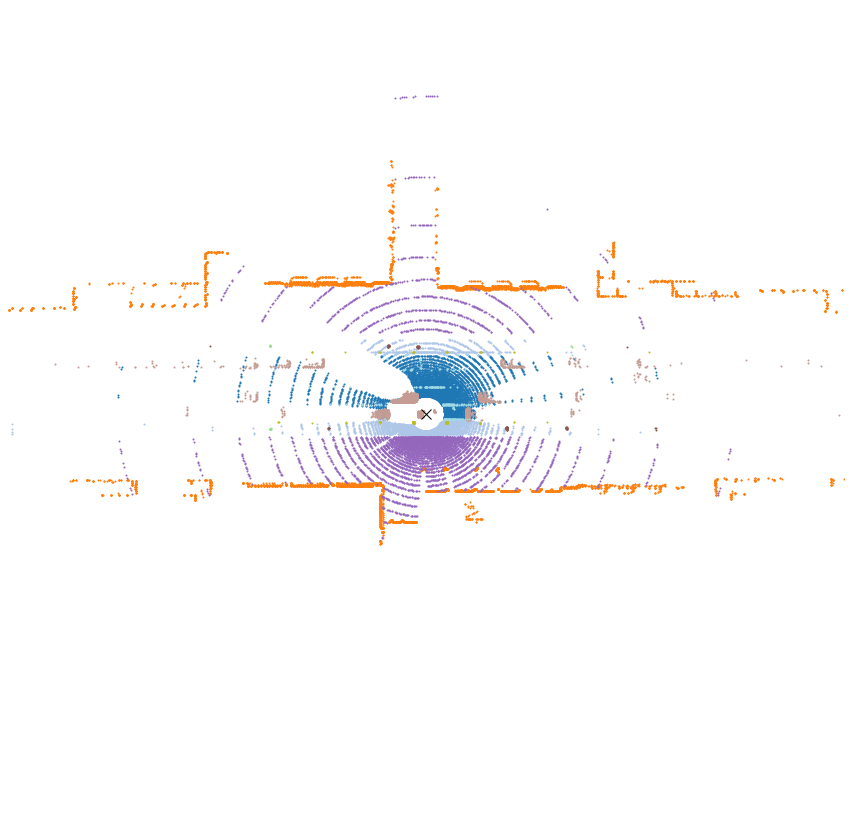

In [9]:
import laspy
# Load semantic lidar data
with laspy.open(SEMANTIC_LIDAR_PATH) as f:
    semantic_lidar = f.read()

print(f"Loaded {semantic_lidar.header.point_count} points from {SEMANTIC_LIDAR_PATH}")

# Extract points and colors
points = semantic_lidar.points
x = points.x
y = points.y
z = points.z
cos_alpha = points.cos_alpha
instance_id = points.instance_id
semantic_tag = points.semantic_tag

print(f"Number of points: {len(x)}")
print(f"Unique semantic tags: {np.unique(semantic_tag)}")
print(f"Unique instance IDs: {np.unique(instance_id)}")

# Plot semantic lidar points in BEV
plt.figure(figsize=(15, 15))
# invert y values

# Convert to ego frame using LIDAR2EGO
sem_pcd_homogeneous = np.hstack((x[:, np.newaxis], y[:, np.newaxis], z[:, np.newaxis], np.ones((x.shape[0], 1))))
sem_pcd_ego = np.dot(calib['LIDAR2EGO'][:3, :3], sem_pcd_homogeneous[:, :3].T).T + calib['LIDAR2EGO'][:3, 3]
x_ego = sem_pcd_ego[:, 0]
y_ego = sem_pcd_ego[:, 1] 
# Plot points with color based on semantic tag
colors = plt.cm.get_cmap('tab20', np.max(semantic_tag) + 1)
for tag in np.unique(semantic_tag):
    mask = semantic_tag == tag
    plt.scatter(x_ego[mask], y_ego[mask], c=[colors(tag)], s=1, label=f'Semantic Tag {tag}')
# draw an X in the center (ego vehicle)
plt.plot(0, 0, 'kx', markersize=10, label='Ego Vehicle')
# Add labels and legend
plt.xlabel('X (m)')
plt.ylabel('Y (m)')
# plt.title('Semantic Lidar Points in BEV')
plt.xlim(-70, 70)
plt.ylim(-70, 70)   
plt.axis('off')
plt.grid(True)
plt.savefig(f"{ITEM}_semantic_lidar_bev.png", bbox_inches='tight', dpi=300)
plt.show()

# DATASET ANALYSIS

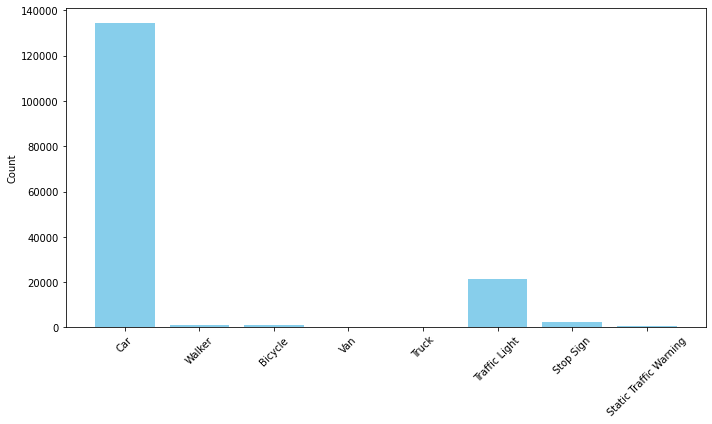

In [10]:
total_instances = 160817
car = 134196
walker = 1083
bicycle = 1124
van = 107
truck = 106
traffic_light = 21529
stop_sign = 2193
static_traffic_warning = 479

# histogram
plt.figure(figsize=(10, 6))
labels = ['Car', 'Walker', 'Bicycle', 'Van', 'Truck', 'Traffic Light', 'Stop Sign', 'Static Traffic Warning']
counts = [car, walker, bicycle, van, truck, traffic_light, stop_sign, static_traffic_warning]
plt.bar(labels, counts, color='skyblue')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Route lenghts: [8061.292]
Route durations: [81.95]


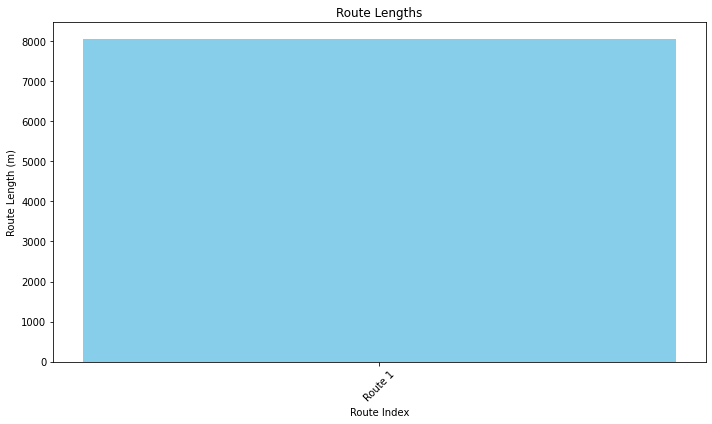

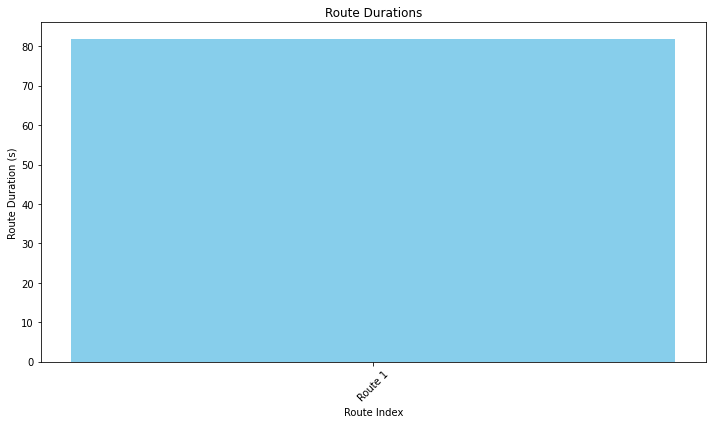

In [11]:
import gzip

# open gz file 
PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/results.json.gz"

# iterate over all folders of f"/home/nupdm/Datasets/nuPDM/{SET}"
if not os.path.exists(PATH):
    print(f"File {PATH} does not exist.")
    exit()

ordered_folders = sorted(os.listdir(f"/home/nupdm/Datasets/nuPDM/{SET}"))

route_lenghts = []
route_durations = []

for folder in ordered_folders:
    if folder.startswith('route'):
        PATH = f"/home/nupdm/Datasets/nuPDM/{SET}/{folder}/results.json.gz"
        with gzip.open(PATH, 'rt') as f:
            results = json.load(f)
        for key, value in results.items():
            if key == "meta":
                route_lenghts.append(value['route_length'])
                route_durations.append(value['duration_game'])

print(f"Route lenghts: {route_lenghts}")
print(f"Route durations: {route_durations}")

# bar plot
plt.figure(figsize=(10, 6))
plt.bar(range(len(route_lenghts)), route_lenghts, color='skyblue')
plt.xlabel('Route Index')
plt.ylabel('Route Length (m)')
plt.title('Route Lengths')
plt.xticks(range(len(route_lenghts)), [f'Route {i+1}' for i in range(len(route_lenghts))], rotation=45)
plt.tight_layout()
# plt.savefig(f"route_lengths.png", bbox_inches='tight', dpi=300)
plt.show()

# bar plot
plt.figure(figsize=(10, 6))
plt.bar(range(len(route_durations)), route_durations, color='skyblue')
plt.xlabel('Route Index')
plt.ylabel('Route Duration (s)')
plt.title('Route Durations')
plt.xticks(range(len(route_durations)), [f'Route {i+1}' for i in range(len(route_durations))], rotation=45)
plt.tight_layout()
# plt.savefig(f"route_durations.png", bbox_inches='tight', dpi=300)
plt.show()

# PLOT PCD IN CAMERAS

Point cloud shape: (31463, 4)


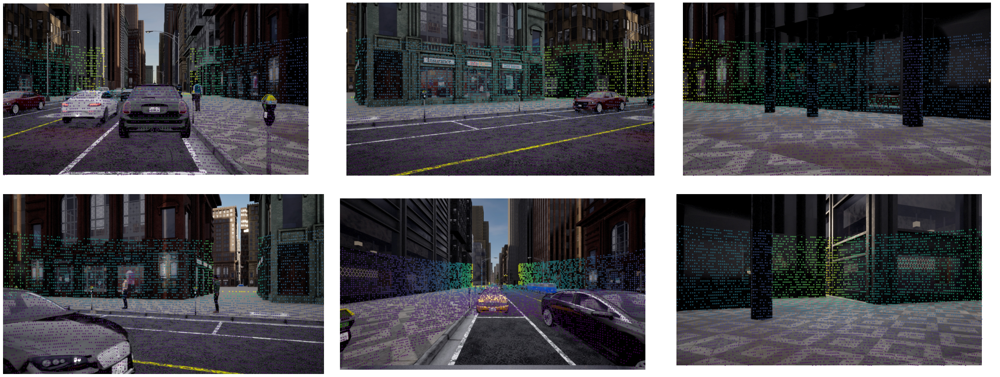

In [12]:
# i want to project the pcd onto every camera in a single figure
CAMERAS_DICT = {
    "CAM_FRONT": CAM_FRONT_PATH,
    "CAM_FRONT_LEFT": CAM_FRONT_LEFT_PATH,
    "CAM_FRONT_RIGHT": CAM_FRONT_RIGHT_PATH,
    "CAM_BACK_LEFT": CAM_BACK_LEFT_PATH,
    "CAM_BACK": CAM_BACK_PATH,
    "CAM_BACK_RIGHT": CAM_BACK_RIGHT_PATH
}

pcd = np.fromfile(PCD_PATH, dtype=np.float32).reshape(-1, 4)
pcd_homogeneous = np.hstack((pcd[:, :3], np.ones((pcd.shape[0], 1))))

print(f"Point cloud shape: {pcd_homogeneous.shape}")

# Crear figura
fig = plt.figure(figsize=(32, 12))
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.05, hspace=0.05)

for i, (key, value) in enumerate(CAMERAS_DICT.items()):
    ax = fig.add_subplot(2, 3, i + 1)
    img = mpimg.imread(value)

    ax.imshow(img)
    ax.axis('off')

    # Obtener matrices de calibración
    cam_K = calib[f'{key}_K']
    lidar2cam = calib[f'LIDAR2{key}']

    # Proyección de puntos
    pcd_cam = np.dot(lidar2cam, pcd_homogeneous.T).T
    pcd_cam = pcd_cam[pcd_cam[:, 2] > 0]  # Mantener solo puntos delante de la cámara
    pcd_img = np.dot(cam_K, pcd_cam.T).T
    pcd_img[:, 0] /= pcd_img[:, 2]
    pcd_img[:, 1] /= pcd_img[:, 2]

    # Filtrar puntos dentro de la imagen
    mask = (
        (pcd_img[:, 0] >= 0) & (pcd_img[:, 0] < img.shape[1]) &
        (pcd_img[:, 1] >= 0) & (pcd_img[:, 1] < img.shape[0])
    )
    pcd_img = pcd_img[mask]
    depth = pcd_cam[mask, 2]  # Usar profundidad real como color

    # Representar los puntos
    ax.scatter(pcd_img[:, 0], pcd_img[:, 1], c=depth, s=5, cmap='viridis', alpha=0.5)

# plt.savefig(f"{ITEM}_pcd_projected_on_cameras.png", bbox_inches='tight', dpi=300)
# Plot the point cloud projected onto each camera image
plt.show()

# PLOT SEMANTIC PCD IN CAMERAS

Loaded 31642 points from /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/lidar_semantic/0010.laz
Number of points: 31642


<Figure size 1080x1080 with 0 Axes>

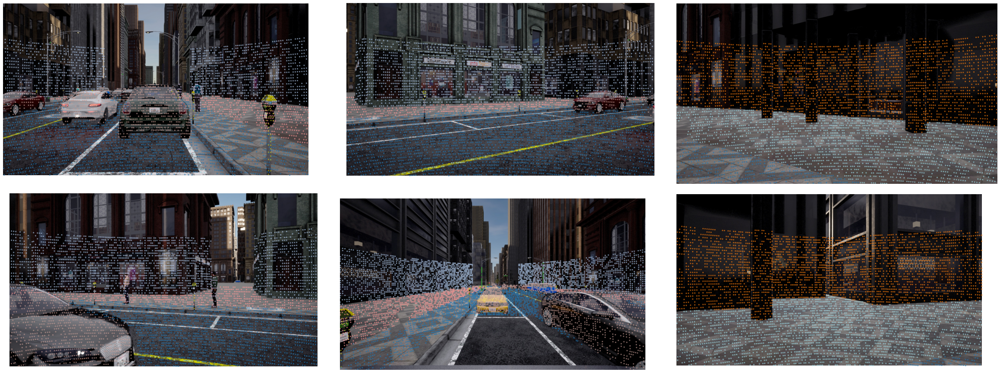

In [13]:
import laspy
# Load semantic lidar data
with laspy.open(SEMANTIC_LIDAR_PATH) as f:
    semantic_lidar = f.read()

print(f"Loaded {semantic_lidar.header.point_count} points from {SEMANTIC_LIDAR_PATH}")

# Extract points and colors
points = semantic_lidar.points
x = points.x
y = points.y
z = points.z
cos_alpha = points.cos_alpha
instance_id = points.instance_id
semantic_tag = points.semantic_tag

print(f"Number of points: {len(x)}")

# Plot semantic lidar points in BEV
plt.figure(figsize=(15, 15))
# invert y values

# Convert to ego frame using LIDAR2EGO
sem_pcd_homogeneous = np.hstack((x[:, np.newaxis], y[:, np.newaxis], z[:, np.newaxis], np.ones((x.shape[0], 1))))

# Crear figura
fig = plt.figure(figsize=(32, 12))
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.05, hspace=0.05)

for i, (key, value) in enumerate(CAMERAS_DICT.items()):
    ax = fig.add_subplot(2, 3, i + 1)
    img = mpimg.imread(value)

    ax.imshow(img)
    ax.axis('off')

    # Obtener matrices de calibración
    cam_K = calib[f'{key}_K']
    lidar2cam = calib[f'LIDAR2{key}']

    # Proyección de puntos
    pcd_cam = np.dot(lidar2cam, sem_pcd_homogeneous.T).T
    mask_front = pcd_cam[:, 2] > 0  # Mantener solo puntos delante de la cámara
    pcd_cam = pcd_cam[mask_front]  # Mantener solo puntos delante de la cámara
    semantic_tag_visible = semantic_tag[mask_front]  # Filtrar etiquetas visibles
    pcd_img = np.dot(cam_K, pcd_cam.T).T
    pcd_img[:, 0] /= pcd_img[:, 2]
    pcd_img[:, 1] /= pcd_img[:, 2]

    # Filtrar puntos dentro de la imagen
    mask = (
        (pcd_img[:, 0] >= 0) & (pcd_img[:, 0] < img.shape[1]) &
        (pcd_img[:, 1] >= 0) & (pcd_img[:, 1] < img.shape[0])
    )
    pcd_img = pcd_img[mask]
    depth = pcd_cam[mask, 2]  # Usar profundidad real como color
    semantic_tag_visible = semantic_tag_visible[mask]  # Filtrar etiquetas visibles

    # Representar los puntos
    ax.scatter(pcd_img[:, 0], pcd_img[:, 1], c=semantic_tag_visible, s=5, cmap='tab20', alpha=0.5)

# plt.savefig(f"{ITEM}_pcd_projected_on_cameras.png", bbox_inches='tight', dpi=300)
# Plot the point cloud projected onto each camera image
plt.show()

# PLOT RADAR PCD IN CAMERAS

Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_FRONT/0010.bin
Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_FRONT_LEFT/0010.bin
Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_FRONT_RIGHT/0010.bin
Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_BACK_LEFT/0010.bin
Processing radar file: /home/nupdm/Datasets/nuPDM/routes_training_new_mini/route_single_routes_training_single_date_07_07_10_17_56/RADAR_BACK_RIGHT/0010.bin
Total number of radar points: 2406


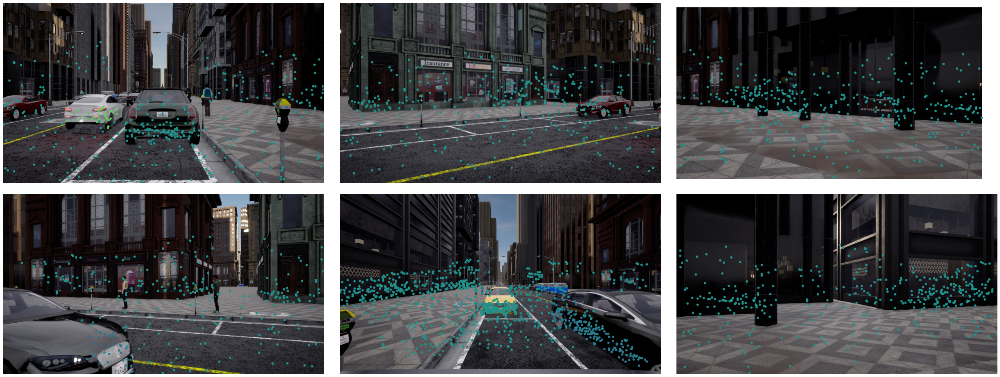

In [14]:
# i want to project the pcd onto every camera in a single figure
RADAR_FILES = [
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_FRONT/{ITEM}.bin",
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_FRONT_LEFT/{ITEM}.bin",
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_FRONT_RIGHT/{ITEM}.bin",
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_BACK_LEFT/{ITEM}.bin",
    f"/home/nupdm/Datasets/nuPDM/{SET}/{ROUTE}/RADAR_BACK_RIGHT/{ITEM}.bin",
]

RADAR_MATRICES = [
    calib['LIDAR2EGO'] @ np.linalg.inv(calib['LIDAR2RADAR_FRONT']),
    calib['LIDAR2EGO'] @ np.linalg.inv(calib['LIDAR2RADAR_FRONT_LEFT']),
    calib['LIDAR2EGO'] @ np.linalg.inv(calib['LIDAR2RADAR_FRONT_RIGHT']),
    calib['LIDAR2EGO'] @ np.linalg.inv(calib['LIDAR2RADAR_BACK_LEFT']),
    calib['LIDAR2EGO'] @ np.linalg.inv(calib['LIDAR2RADAR_BACK_RIGHT']) 
]

# load the 5 radars and group them in a single point cloud, after converting them to ego
for i, radar_file in enumerate(RADAR_FILES):
    print(f"Processing radar file: {radar_file}")
    # open bin file
    pcd = np.fromfile(radar_file, dtype=np.float32)
    pcd = pcd.reshape(-1, 4)
    # following data are given in radians
    ranges = pcd[:, 0]
    altitude = pcd[:, 1]
    azimuth = pcd[:, 2]  # this is in meters
    velocity = pcd[:, 3]  # this is in m/s
    # convert to x, y, z
    x = ranges * np.cos(azimuth) * np.cos(altitude)  # altitude is in radians, convert to meters
    y = -ranges * np.sin(azimuth) * np.cos(altitude)  # Y comes inverted
    z = ranges * np.sin(altitude)  # altitude is already in meters

    # ego radar pcd
    pcd_homogeneous = np.hstack((x[:, np.newaxis], y[:, np.newaxis], z[:, np.newaxis], np.ones((x.shape[0], 1))))
    pcd_ego = pcd_homogeneous @ RADAR_MATRICES[i].T
    x = pcd_ego[:, 0]
    y = pcd_ego[:, 1]  
    z = pcd_ego[:, 2]

    # create a single point cloud with all radars
    if i == 0:
        radar_pcd = np.array([x, y, z, velocity]).T
    else:
        radar_pcd = np.vstack((radar_pcd, np.array([x, y, z, velocity]).T))

print(f"Total number of radar points: {len(radar_pcd)}")

# Crear figura
fig = plt.figure(figsize=(32, 12))
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.05, hspace=0.05)

# Convertir el radar PCD a homogéneo
radar_pcd_homogeneous = np.hstack((radar_pcd[:, :3], np.ones((radar_pcd.shape[0], 1))))
all_velocities = radar_pcd[:, 3]  # Extraer velocidades

for i, (key, value) in enumerate(CAMERAS_DICT.items()):
    ax = fig.add_subplot(2, 3, i + 1)
    img = mpimg.imread(value)

    ax.imshow(img)
    ax.axis('off')

    # Obtener matrices de calibración
    cam_K = calib[f'{key}_K']
    lidar2cam = calib[f'LIDAR2{key}']
    ego2cam = lidar2cam @ np.linalg.inv(calib['LIDAR2EGO'])

    # Proyección de puntos
    radar_pcd_cam = np.dot(ego2cam, radar_pcd_homogeneous.T).T

    mask = (radar_pcd_cam[:, 2] > 0)  # Mantener solo puntos delante de la cámara
    radar_pcd_cam = radar_pcd_cam[mask]  # Filtrar puntos delante de la cámara
    velocities = all_velocities[mask]  # Filtrar velocidades según la máscara

    pcd_img = np.dot(cam_K, radar_pcd_cam.T).T
    pcd_img[:, 0] /= pcd_img[:, 2]
    pcd_img[:, 1] /= pcd_img[:, 2]

    # Filtrar puntos dentro de la imagen
    mask = (
        (pcd_img[:, 0] >= 0) & (pcd_img[:, 0] < img.shape[1]) &
        (pcd_img[:, 1] >= 0) & (pcd_img[:, 1] < img.shape[0])
    )
    pcd_img = pcd_img[mask]
    depth = radar_pcd_cam[mask, 2]  # Usar profundidad real como color

    velocities = velocities[mask]  # Filtrar velocidades según la máscara

    # Representar los puntos
    ax.scatter(pcd_img[:, 0], pcd_img[:, 1], c=velocities, s=20, cmap='viridis', alpha=1, vmin=-15.0, vmax=15.0)

# plt.savefig(f"{ITEM}_pcd_projected_on_cameras.png", bbox_inches='tight', dpi=300)
# Plot the point cloud projected onto each camera image
plt.show()